In [79]:
import matplotlib.pyplot as plt
import geopandas as gpd 
import contextily as cx

from mpl_toolkits.axes_grid1 import inset_locator
from pathlib import Path

In [122]:
countries_gdf.SOVEREIGNT

160                    France
154                    Greece
236                   Albania
118           North Macedonia
96                Netherlands
137                     Italy
5                     Vatican
130                    Kosovo
105                Montenegro
208                  Bulgaria
108                    Monaco
212    Bosnia and Herzegovina
69                 San Marino
65         Republic of Serbia
188                   Croatia
33                    Ukraine
76                    Romania
61                   Slovenia
47                Switzerland
146                   Hungary
121             Liechtenstein
224                   Austria
60                   Slovakia
184                   Czechia
156                   Germany
79                     Poland
119                Luxembourg
217                   Belgium
75                     Russia
218                   Belarus
120                 Lithuania
183                   Denmark
126                    Latvia
172       

Objectives: 

show domain with topographical basemap
show rivers and locator map 

In [ ]:
# Remove NA & non-numeric columns and normalize with z-score for PCA.

# Load attributes and hydrologic indices.
attributes_shape_path = Path("/home/wuhlmann/BA/data/raw_data/2_LamaH-CE_daily/B_basins_intermediate_all/3_shapefiles/Basins_B.shp")
hydro_indices_path = Path("/home/wuhlmann/BA/data/raw_data/2_LamaH-CE_daily/D_gauges/1_attributes/Hydro_indices_1981_2017.csv")

basin_stca_gdf = gpd.read_file(attributes_shape_path)
basin_stca_gdf.set_index("ID", inplace=True)
basin_stca_gdf.to_crs(epsg=3857, inplace=True)

# get additionally files for plotting 
gauges_pdf = gpd.read_file(Path("/home/wuhlmann/BA/data/raw_data/2_LamaH-CE_daily/D_gauges/3_shapefiles/Gauges.shp"))
gauges_pdf.to_crs(epsg=3857, inplace=True)
river_regions_gdf = gpd.read_file(Path("/home/wuhlmann/BA/data/raw_data/2_LamaH-CE_daily/G_appendix/3_shapefiles/River_regions.shp"))
river_regions_gdf.to_crs(epsg=3857, inplace=True)
river_atlas_gdf = gpd.read_file(Path("/home/wuhlmann/BA/data/raw_data/2_LamaH-CE_daily/E_stream_network/RiverATLAS.shp"))
river_atlas_gdf.to_crs(epsg=3857, inplace=True)
countries_gdf = gpd.read_file("/home/wuhlmann/BA/data/raw_data/plotting/ne_50m_admin_0_countries/ne_50m_admin_0_countries.shp")
countries_gdf = countries_gdf.clip([5, 40, 23, 60], keep_geom_type=True)
countries_gdf.to_crs(epsg=3857, inplace=True)



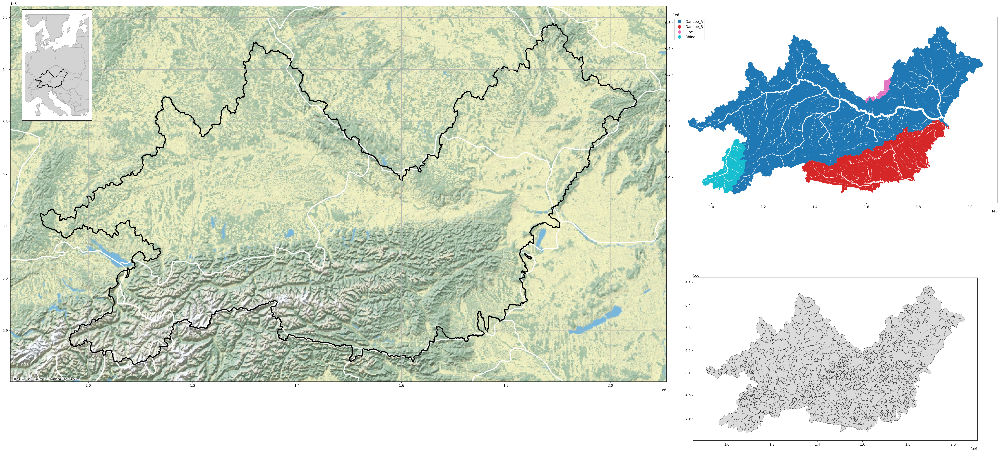

In [159]:
plt.rcParams["figure.dpi"] = 150 
fig, ax = plt.subplot_mosaic(
    "AAB;AAC",
    figsize=(40, 20),
    gridspec_kw={"height_ratios": [2,1]}
)

order_to_lw = {3: 0.5, 4: 1.0, 5: 2.0, 6: 3.5, 7: 5.5}
river_lw = river_atlas_gdf["ORD_STRA"].map(order_to_lw)

# A – Übersichtskarte (oben, volle Breite)
basin_union = gpd.GeoSeries(basin_stca_gdf.geometry.union_all())

basin_union.plot(ax=ax["A"], color="none", linewidth=1)
xlim, ylim = ax["A"].get_xlim(), ax["A"].get_ylim()

countries_gdf.plot(ax=ax["A"], color="none", edgecolor="white", linewidth=3)
ax["A"].set_xlim(xlim)
ax["A"].set_ylim(ylim)
ax["A"].grid(True)

basin_union.plot(ax=ax["A"], color="none", linewidth=3)
cx.add_basemap(ax=ax["A"], source=cx.providers.Esri.WorldPhysical, zoom=8)

# Inset
iax = inset_locator.inset_axes(
    ax["A"], width=3.5, height=4.5, loc="upper left", borderpad=1,
    axes_kwargs={"xticks": [], "yticks": []},
)
countries_gdf.plot(ax=iax, color="lightgray", edgecolor="darkgray")
basin_union.plot(ax=iax, color="none", linewidth=1)

# B – Flussregionen + Flussnetz (unten links)
river_regions_gdf.plot(
    ax=ax["B"], column="m_region", linewidth=1.2,
    legend=True, legend_kwds={"loc": "upper left"},
)
river_atlas_gdf[river_atlas_gdf.ORD_STRA > 2].plot(
    ax=ax["B"], linewidth=river_lw[river_atlas_gdf.ORD_STRA > 2], color="white",
)

# C – Teileinzugsgebiete (unten rechts)
basin_stca_gdf.plot(
    ax=ax["C"], color="lightgrey", alpha=0.8, edgecolor="black", linewidth=0.5,
)

# ── B und C auf denselben Extent wie A setzen  ← das ist der eigentliche Fix
xlim_a, ylim_a = ax["A"].get_xlim(), ax["A"].get_ylim()
for key in ["B", "C"]:
    ax[key].set_xlim(xlim_a)
    ax[key].set_ylim(ylim_a)

# ── Whitespace komplett eliminieren
fig.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0.02, hspace=0.02)

plt.show()